In [2]:
from umap import UMAP
from datasets import load_dataset
from hdbscan import HDBSCAN
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from bertopic import BERTopic

In [3]:
dataset = load_dataset("maartengr/arxiv_nlp")["train"]

abstracts = dataset["Abstracts"]
titles = dataset["Titles"]

In [4]:
from sentence_transformers import SentenceTransformer

# Create an embedding for each abstract
embedding_model = SentenceTransformer('thenlper/gte-small')
embeddings = embedding_model.encode(abstracts,show_progress_bar=True)

Batches: 100%|██████████| 1405/1405 [02:21<00:00,  9.90it/s]


In [5]:
#embedding dimension
embeddings.shape

(44949, 384)

### Reducing dimension of embeddings

In [6]:
umap_model = UMAP(
    n_components = 5,min_dist=0.0,metric="cosine",random_state=42
)
reduced_embeddings = umap_model.fit_transform(embeddings)

In [7]:
#dimension is reduced to 5
reduced_embeddings.shape

(44949, 5)

### Cluster the Reduced Embeddings

In [8]:
# We fit the model and extract the clusters
hdbscan_model = HDBSCAN(
    min_cluster_size=50,metric="euclidean",cluster_selection_method='eom'
).fit(reduced_embeddings)
clusters = hdbscan_model.labels_

len(set(clusters))


145

### Inspecting the clusters

In [10]:
# Print first three documents in cluster 0
cluster = 0
for index in np.where(clusters==cluster)[0][:4]:
    print(abstracts[index][:300]+"...\n")


  This works aims to design a statistical machine translation from English text
to American Sign Language (ASL). The system is based on Moses tool with some
modifications and the results are synthesized through a 3D avatar for
interpretation. First, we translate the input text to gloss, a written fo...

  Researches on signed languages still strongly dissociate lin- guistic issues
related on phonological and phonetic aspects, and gesture studies for
recognition and synthesis purposes. This paper focuses on the imbrication of
motion and meaning for the analysis, synthesis and evaluation of sign lang...

  Modern computational linguistic software cannot produce important aspects of
sign language translation. Using some researches we deduce that the majority of
automatic sign language translation systems ignore many aspects when they
generate animation; therefore the interpretation lost the truth inf...

  Automatic speech processing systems are employed more and more often in real
enviro

#### Next, we reduce our embeddings to 2-dimensions so that we can plot them and get a rough understanding of the generated clusters.

In [11]:
reduced_embeddings = UMAP(
    n_components=2,min_dist=0,metric="cosine",random_state=42
).fit_transform(embeddings)
# Create dataframe
df = pd.DataFrame(reduced_embeddings, columns=["x", "y"])
df["title"] = titles
df["cluster"] = [str(c) for c in clusters]

# Select outliers and non-outliers (clusters)
clusters_df = df.loc[df.cluster != "-1", :]
outliers_df = df.loc[df.cluster == "-1", :]


(-7.115280747413635,
 12.464183926582336,
 -2.0523813247680662,
 16.575574684143067)

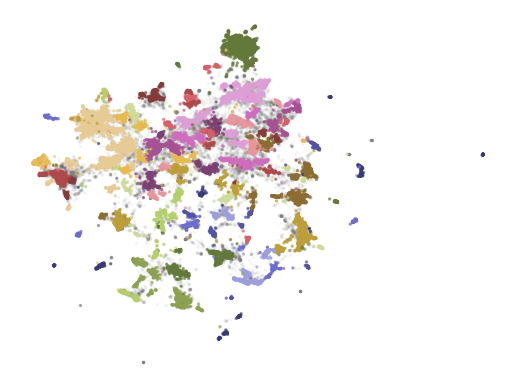

In [13]:
# Plot outliers and non-outliers seperately
plt.scatter(outliers_df.x, outliers_df.y, alpha=0.05, s=2, c="grey")
plt.scatter(
    clusters_df.x, clusters_df.y, c=clusters_df.cluster.astype(int),
    alpha=0.6, s=2, cmap='tab20b'
)
plt.axis('off')

### From text clustering to topic modeling

#### BERTopic: A Modular Topic Modeling Framework

In [14]:
topic_model = BERTopic(
    embedding_model=embedding_model,
    umap_model=umap_model,
    hdbscan_model=hdbscan_model,
    verbose=True
).fit(abstracts,embeddings)


2025-03-06 18:15:19,117 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2025-03-06 18:15:50,189 - BERTopic - Dimensionality - Completed ✓
2025-03-06 18:15:50,190 - BERTopic - Cluster - Start clustering the reduced embeddings
2025-03-06 18:15:51,947 - BERTopic - Cluster - Completed ✓
2025-03-06 18:15:51,957 - BERTopic - Representation - Extracting topics from clusters using representation models.
2025-03-06 18:15:55,238 - BERTopic - Representation - Completed ✓


In [15]:
topic_model.get_topic_info()


,Topic,Count,Name,Representation,Representative_Docs
0,-1,13927,-1_the_of_and_to,"[the, of, and, to, in, we, for, that, language...",[ Contrastive pretraining techniques for text...
1,0,2255,0_speech_asr_recognition_end,"[speech, asr, recognition, end, acoustic, spea...",[ The amount of labeled data to train models ...
2,1,2097,1_question_qa_questions_answer,"[question, qa, questions, answer, answering, a...","[ In multi-hop QA, answering complex question..."
3,2,1140,2_medical_clinical_biomedical_patient,"[medical, clinical, biomedical, patient, notes...",[ Recent years have seen particular interest ...
4,3,948,3_translation_nmt_machine_neural,"[translation, nmt, machine, neural, bleu, engl...",[ Neural Machine Translation (NMT) has obtain...
...,...,...,...,...,...
140,139,54,139_mixed_code_sentiment_mixing,"[mixed, code, sentiment, mixing, english, anal...",[ In today's interconnected and multilingual ...
141,140,52,140_gans_gan_adversarial_generation,"[gans, gan, adversarial, generation, generativ...",[ Text generation is of particular interest i...
142,141,51,141_reviews_opinion_summaries_summarization,"[reviews, opinion, summaries, summarization, r...",[ When faced with a large number of product r...
143,142,50,142_coherence_discourse_text_cohesion,"[coherence, discourse, text, cohesion, paragra...",[ Coherence is an essential property of well-...


In [16]:
topic_model.get_topic(0)

[('speech', 0.02941921730454522),
 ('asr', 0.019518941402899708),
 ('recognition', 0.013957706693498877),
 ('end', 0.01021951533645234),
 ('acoustic', 0.009704160485343593),
 ('speaker', 0.007071842195343091),
 ('audio', 0.006944383699954821),
 ('the', 0.006768403092057995),
 ('error', 0.00660773101330808),
 ('to', 0.006581323952150061)]

In [18]:
topic_model.find_topics("rumor")

([143, 43, 32, 31, 45],
 [0.89533496, 0.8501788, 0.8489858, 0.8312998, 0.828862])

In [19]:
topic_model.get_topic(143)

[('rumor', 0.06695506345897483),
 ('rumour', 0.050441007469728245),
 ('rumors', 0.04458702065365078),
 ('rumours', 0.03329368370076483),
 ('stance', 0.02844776553728303),
 ('veracity', 0.022239230174627058),
 ('detection', 0.01854632886246926),
 ('social', 0.0178798437358601),
 ('media', 0.017864249399473828),
 ('posts', 0.011976923841635982)]

### Visualizations

In [20]:
fig = topic_model.visualize_documents(
    titles,
    reduced_embeddings=reduced_embeddings,
    width=1200,
    hide_annotations=True
)
fig.update_layout(font=dict(size=16))



ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'hoverinfo': 'text',
              'hovertext': array(['Feature-Augmented Neural Networks for Patient Note De-identification',
                                  'Did Translation Models Get More Robust Without Anyone Even Noticing?',
                                  'Evidence Inference 2.0: More Data, Better Models', ...,
                                  "CoSMo: A constructor specification language for Abstract Wikipedia's\n  content selection process",
                                  'Multi-class Multilingual Classification of Wikipedia Articles Using\n  Extended Named Entity Tag Set',
                                  None], dtype=object),
              'marker': {'color': '#CFD8DC', 'opacity': 0.5, 'size': 5},
              'mode': 'markers+text',
              'name': 'other',
              'showlegend': False,
              'type': 'scattergl',
              'x': {'bdata': ('kcWYQLgNHUD6pIBARodGQMiuC8AIkP' ... 'VAO/dwQFdfEcCrKBDAxWWAQAI2OT4='),
                    'dtype': 'f4'},
              'y': {'bdata': ('t6yrQFMXS0ETCa5AswocQV6cJkD/KQ' ... 'dApks1QQzBGEGRM81A5ngEQR0DDEE='),
                    'dtype': 'f4'}},
             {'hoverinfo': 'text',
              'hovertext': array(['Fast End-to-End Speech Recognition via Non-Autoregressive Models and\n  Cross-Modal Knowledge Transferring from BERT',
                                  'Leveraging pre-trained representations to improve access to\n  untranscribed speech from endangered languages',
                                  'Learning weakly supervised multimodal phoneme embeddings', ...,
                                  'MeetDot: Videoconferencing with Live Translation Captions',
                                  'Neural Language Codes for Multilingual Acoustic Models',
                                  'Very Deep Convolutional Networks for End-to-End Speech Recognition'],
                                 dtype=object),
              'marker': {'opacity': 0.5, 'size': 5},
              'mode': 'markers+text',
              'name': '0_speech_asr_recognition',
              'text': array(['', '', '', ..., '', '', ''], dtype=object),
              'textfont': {'size': 12},
              'type': 'scattergl',
              'x': {'bdata': ('mInUP1C2C0AW5Mo/MpsEQLasm78fAy' ... 'E/oiAHQJFhEEB0vRFAA/wNQFJD2D8='),
                    'dtype': 'f4'},
              'y': {'bdata': ('uPJpQUfMbkG7zXFB09ZiQWE0s0CH83' ... 'lBzc9hQR5abEFrPV5BIU1tQY/AbUE='),
                    'dtype': 'f4'}},
             {'hoverinfo': 'text',
              'hovertext': array(['On the Multi-Property Extraction and Beyond',
                                  'Understanding tables with intermediate pre-training',
                                  'BioTABQA: Instruction Learning for Biomedical Table Question Answering',
                                  ...,
                                  'A General FOFE-net Framework for Simple and Effective Question Answering\n  over Knowledge Bases',
                                  'Robust Question Answering Through Sub-part Alignment',
                                  'RoMQA: A Benchmark for Robust, Multi-evidence, Multi-answer Question\n  Answering'],
                                 dtype=object),
              'marker': {'opacity': 0.5, 'size': 5},
              'mode': 'markers+text',
              'name': '1_question_qa_questions',
              'text': array(['', '', '', ..., '', '', ''], dtype=object),
              'textfont': {'size': 12},
              'type': 'scattergl',
              'x': {'bdata': ('9ImBwGl9S8AIulvABjlXwG96XsCpdo' ... 'lVwOUFgsDSoonAoWtdwB0xhMD+LWPA'),
                    'dtype': 'f4'},
              'y': {'bdata': ('KFg1QdbeIkFboylBvqgqQbczOEHOai' ... 'M5QQeNLEF88ylBuEU2QRtmLkEiGi5B'),
                    'dtype': 'f4'}},
             {'hoverinfo': 'text',
              'hovertext': array(['Combining LSTM and Latent Topic Modeling for Mortality Prediction',
                                  'Bringing S

In [21]:
# Visualize barchart with ranked keywords
topic_model.visualize_barchart()

# Visualize relationships between topics
topic_model.visualize_heatmap(n_clusters=30)

# Visualize the potential hierarchical structure of topics
topic_model.visualize_hierarchy()

ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'hoverinfo': 'text',
              'marker': {'color': 'rgb(61,153,112)'},
              'mode': 'lines',
              'type': 'scatter',
              'x': {'bdata': 'AAAAAAAAAADWepzd9g3TP9Z6nN32DdM/AAAAAAAAAAA=', 'dtype': 'f8'},
              'xaxis': 'x',
              'y': {'bdata': 'AAAAAAAALsAAAAAAAAAuwAAAAAAAADnAAAAAAAAAOcA=', 'dtype': 'f8'},
              'yaxis': 'y'},
             {'hoverinfo': 'text',
              'marker': {'color': 'rgb(61,153,112)'},
              'mode': 'lines',
              'type': 'scatter',
              'x': {'bdata': 'AAAAAAAAAAB1DSJzsMLfP3UNInOwwt8/1nqc3fYN0z8=', 'dtype': 'f8'},
              'xaxis': 'x',
              'y': {'bdata': 'AAAAAAAAFMAAAAAAAAAUwAAAAAAAADTAAAAAAAAANMA=', 'dtype': 'f8'},
              'yaxis': 'y'},
             {'hoverinfo': 'text',
              'marker': {'color': 'rgb(255,65,54)'},
              'mode': 'lines',
              'type': 'scatter',
              'x': {'bdata': 'AAAAAAAAAAAOjVBaL6jWPw6NUFovqNY/AAAAAAAAAAA=', 'dtype': 'f8'},
              'xaxis': 'x',
              'y': {'bdata': 'AAAAAACAQcAAAAAAAIBBwAAAAAAAgEbAAAAAAACARsA=', 'dtype': 'f8'},
              'yaxis': 'y'},
             {'hoverinfo': 'text',
              'marker': {'color': 'rgb(255,65,54)'},
              'mode': 'lines',
              'type': 'scatter',
              'x': {'bdata': 'AAAAAAAAAACAHsnuGs3dP4Aeye4azd0/AAAAAAAAAAA=', 'dtype': 'f8'},
              'xaxis': 'x',
              'y': {'bdata': 'AAAAAACAS8AAAAAAAIBLwAAAAAAAQFDAAAAAAABAUMA=', 'dtype': 'f8'},
              'yaxis': 'y'},
             {'hoverinfo': 'text',
              'marker': {'color': 'rgb(255,65,54)'},
              'mode': 'lines',
              'type': 'scatter',
              'x': {'bdata': 'gB7J7hrN3T/mT6L+VBbkP+ZPov5UFuQ/AAAAAAAAAAA=', 'dtype': 'f8'},
              'xaxis': 'x',
              'y': {'bdata': 'AAAAAAAATsAAAAAAAABOwAAAAAAAwFLAAAAAAADAUsA=', 'dtype': 'f8'},
              'yaxis': 'y'},
             {'hoverinfo': 'text',
              'marker': {'color': 'rgb(255,65,54)'},
              'mode': 'lines',
              'type': 'scatter',
              'x': {'bdata': 'AAAAAAAAAAB8ZRqcTnXTP3xlGpxOddM/AAAAAAAAAAA=', 'dtype': 'f8'},
              'xaxis': 'x',
              'y': {'bdata': 'AAAAAABAVcAAAAAAAEBVwAAAAAAAwFfAAAAAAADAV8A=', 'dtype': 'f8'},
              'yaxis': 'y'},
             {'hoverinfo': 'text',
              'marker': {'color': 'rgb(255,65,54)'},
              'mode': 'lines',
              'type': 'scatter',
              'x': {'bdata': '5k+i/lQW5D9zG/L/RLvkP3Mb8v9Eu+Q/fGUanE510z8=', 'dtype': 'f8'},
              'xaxis': 'x',
              'y': {'bdata': 'AAAAAADgUMAAAAAAAOBQwAAAAAAAgFbAAAAAAACAVsA=', 'dtype': 'f8'},
              'yaxis': 'y'},
             {'hoverinfo': 'text',
              'marker': {'color': 'rgb(255,65,54)'},
              'mode': 'lines',
              'type': 'scatter',
              'x': {'bdata': 'cxvy/0S75D8YBH7hNvHnPxgEfuE28ec/AAAAAAAAAAA=', 'dtype': 'f8'},
              'xaxis': 'x',
              'y': {'bdata': 'AAAAAACwU8AAAAAAALBTwAAAAAAAQFrAAAAAAABAWsA=', 'dtype': 'f8'},
              'yaxis': 'y'},
             {'hoverinfo': 'text',
              'marker': {'color': 'rgb(255,65,54)'},
              'mode': 'lines',
              'type': 'scatter',
              'x': {'bdata': 'Do1QWi+o1j+pFQHmtkHpP6kVAea2Qek/GAR+4Tbx5z8=', 'dtype': 'f8'},
              'xaxis': 'x',
              'y': {'bdata': 'AAAAAAAARMAAAAAAAABEwAAAAAAA+FbAAAAAAAD4VsA=', 'dtype': 'f8'},
              'yaxis': 'y'},
             {'hoverinfo': 'text',
              'marker': {'color': 'rgb(0,116,217)'},
              'mode': 'lines',
              'type': 'scatter',
              'x': {'bdata': 'dQ0ic7DC3z8xjs04Q6nxPzGOzThDqfE/qRUB5rZB6T8=', 'dtype': 'f8'},
              'xaxis': 'x',
              'y': {'bdata': 'AAAAAAAAKcAAAAAAAAApwAAAAAAAfFDAAAAAAAB8UMA=', 'dtype': 'f8'},
              'yaxis': 'y'},
             {'hoverinfo': 'text',
    

### Representation Models

In [22]:
from copy import deepcopy
original_topics = deepcopy(topic_model.topic_representations_)
original_topics


{-1: [('the', 0.0063893472418137184),
  ('of', 0.006385160071963191),
  ('and', 0.0063151714600601155),
  ('to', 0.006123736692759971),
  ('in', 0.0059694018885035945),
  ('we', 0.005776074746750613),
  ('for', 0.0055625192332920135),
  ('that', 0.005439001996608545),
  ('language', 0.005400285562016676),
  ('on', 0.005318480873820347)],
 0: [('speech', 0.02941921730454522),
  ('asr', 0.019518941402899708),
  ('recognition', 0.013957706693498877),
  ('end', 0.01021951533645234),
  ('acoustic', 0.009704160485343593),
  ('speaker', 0.007071842195343091),
  ('audio', 0.006944383699954821),
  ('the', 0.006768403092057995),
  ('error', 0.00660773101330808),
  ('to', 0.006581323952150061)],
 1: [('question', 0.02249459223897888),
  ('qa', 0.01678346433856384),
  ('questions', 0.016542041301942294),
  ('answer', 0.01637503513205059),
  ('answering', 0.01548118485540844),
  ('answers', 0.010071512257063863),
  ('retrieval', 0.009559424200421425),
  ('comprehension', 0.008228377208096261),
  ('

In [23]:
def topic_differences(model,original_topics,nr_topics=5):
    df = pd.DataFrame(columns=["Topic","Original","Updated"])
    for topic in range(nr_topics):
        # Extract top 5 words per topic per model
        og_words = " | ".join(list(zip(*original_topics[topic]))[0][:5])
        new_words = " | ".join(list(zip(*model.get_topic(topic)))[0][:5])
        df.loc[len(df)] = [topic, og_words, new_words]
    return df


In [24]:
from bertopic.representation import KeyBERTInspired

# Update our topic representations using KeyBERTInspired
representation_model = KeyBERTInspired()
topic_model.update_topics(abstracts, representation_model=representation_model)

# Show topic differences
topic_differences(topic_model, original_topics)

,Topic,Original,Updated
0,0,speech | asr | recognition | end | acoustic,transcription | speech | encoder | phonetic | ...
1,1,question | qa | questions | answer | answering,answering | questions | comprehension | retrie...
2,2,medical | clinical | biomedical | patient | notes,nlp | ehr | text | ehrs | clinical
3,3,translation | nmt | machine | neural | bleu,translation | translations | translate | multi...
4,4,summarization | summaries | summary | abstract...,summarization | summarizers | summaries | summ...


### Text Generation : Flan-T5

In [25]:
from transformers import pipeline
from bertopic.representation import TextGeneration

prompt = """I have a topic that contains the following documents:
[DOCUMENT]

The topic is described by the following keyword: '[KEYWORDS]'.

Based on the documents and keywords, what is the topic about?"""

#update out topic
generator = pipeline('text2text-generation',model='google/flan-t5-small')
representation_model = TextGeneration(
    generator,prompt=prompt,doc_length=50,tokenizer="whitespace"
)
topic_model.update_topics(abstracts,representation_model=representation_model)

topic_differences(topic_model, original_topics)


Hardware accelerator e.g. GPU is available in the environment, but no `device` argument is passed to the `Pipeline` object. Model will be on CPU.
100%|██████████| 145/145 [00:14<00:00,  9.72it/s]


,Topic,Original,Updated
0,0,speech | asr | recognition | end | acoustic,audio | | | |
1,1,question | qa | questions | answer | answering,answering | | | |
2,2,medical | clinical | biomedical | patient | notes,medicine | | | |
3,3,translation | nmt | machine | neural | bleu,translation | | | |
4,4,summarization | summaries | summary | abstract...,document | | | |
